# Why did I choose this dataset? 🐦
This dataset represents arrest records, detailing information such as the date and time of the arrest, the arrestee's personal information, the statute they were arrested under, and demographic information. The dataset is interesting because it allows for a comprehensive analysis of arrest trends, potentially revealing insights into the criminal justice system and social factors influencing arrests.

We get this data set from [data.gov](https://data.gov/)

### What libraries you need to instal ??

* pip install pandas matplotlib seaborn plotly folium
* pip install wordcloud
* pip install scikit-learn
* pip install branca 


### All inports !!

In [1]:
import string
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import branca.colormap as cm
import plotly.express as px
import folium

from wordcloud import WordCloud
from collections import Counter
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler,LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, classification_report, accuracy_score
from folium.plugins import HeatMap
from sklearn.cluster import KMeans, DBSCAN
from statsmodels.tsa.seasonal import seasonal_decompose


## Load dataset 💻

We have two dataset, the original one and the updated. You will see the updated dataset after the API part of code.

In [2]:
# Load the original dataset
df = pd.read_csv("Datasets/Arrests.csv")
# Load your updated dataset
new_df = pd.read_csv("Datasets/new_Arrests.csv")

# Summary Statistics:

In [3]:
print('Shape of data frame: \n', df.shape,'\n')
print('Columns of data frame: \n', df.columns,'\n')
print(df.info())

Shape of data frame: 
 (11172, 12) 

Columns of data frame: 
 Index(['ArrestID', 'ArrestDatetime', 'FirstName', 'HouseNumber', 'LastName',
       'MiddleName', 'NameSuffix', 'Statute', 'StatuteDescription', 'Street',
       'Race', 'Sex'],
      dtype='object') 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11172 entries, 0 to 11171
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ArrestID            11172 non-null  int64  
 1   ArrestDatetime      11172 non-null  object 
 2   FirstName           11169 non-null  object 
 3   HouseNumber         9916 non-null   float64
 4   LastName            11172 non-null  object 
 5   MiddleName          10432 non-null  object 
 6   NameSuffix          1023 non-null   object 
 7   Statute             11165 non-null  object 
 8   StatuteDescription  11165 non-null  object 
 9   Street              10968 non-null  object 
 10  Race                11160 non-null

In [4]:
# Select only numeric columns
numeric_df = df.select_dtypes(include=['number'])

# Generate summary statistics
summary_stats_mean = numeric_df.mean()
summary_stats_median = numeric_df.median()
summary_stats_std = numeric_df.std()

# Display the summary statistics
print("Mean:")
print(summary_stats_mean)
print("\nMedian:")
print(summary_stats_median)
print("\nStandard Deviation:")
print(summary_stats_std)


Mean:
ArrestID       5586.500000
HouseNumber     982.072005
dtype: float64

Median:
ArrestID       5586.5
HouseNumber     618.0
dtype: float64

Standard Deviation:
ArrestID       3225.222938
HouseNumber    1720.436672
dtype: float64


In [5]:
df.describe().round().T

,count,mean,std,min,25%,50%,75%,max
ArrestID,11172.0,5586.0,3225.0,1.0,2794.0,5586.0,8379.0,11172.0
HouseNumber,9916.0,982.0,1720.0,1.0,224.0,618.0,1215.0,42035.0


# Data Transformation:

In [6]:
# List of columns to convert to string
columns_to_string = ['FirstName', 'LastName', 'MiddleName', 'NameSuffix', 'Statute', 'StatuteDescription', 'Street', 'Race']

# Convert the specified columns to string
df[columns_to_string] = df[columns_to_string].astype(str)

# Convert columns 'ArrestDatetime' to date and time
df['ArrestDatetime'] = pd.to_datetime(df['ArrestDatetime'], format='%Y/%m/%d %H:%M:%S%z')

# Verify the changes
print(df.dtypes)
print('\n',df['ArrestDatetime'].head())

ArrestID                            int64
ArrestDatetime        datetime64[ns, UTC]
FirstName                          object
HouseNumber                       float64
LastName                           object
MiddleName                         object
NameSuffix                         object
Statute                            object
StatuteDescription                 object
Street                             object
Race                               object
Sex                                object
dtype: object

 0   2024-06-25 19:26:00+00:00
1   2024-06-25 16:47:00+00:00
2   2024-06-25 16:47:00+00:00
3   2024-06-25 16:47:00+00:00
4   2024-06-24 17:45:00+00:00
Name: ArrestDatetime, dtype: datetime64[ns, UTC]


# Text Preprocessing:

In [7]:
# Function to clean and preprocess text
def preprocess_text(text):
    text = text.lower()  # Convert to lowercase
    text = text.translate(str.maketrans('', '', string.punctuation))  # Remove punctuation
    words = text.split()  # Split into words
    words = [word for word in words if word not in ENGLISH_STOP_WORDS]  # Remove stop words
    return ' '.join(words)

# Fill missing values with an empty string
df['StatuteDescription'] = df['StatuteDescription'].fillna('')

# Apply the preprocessing function to the 'StatuteDescription' column
df['CleanedStatuteDescription'] = df['StatuteDescription'].apply(preprocess_text)

# Display the first few cleaned descriptions
print(df[['StatuteDescription', 'CleanedStatuteDescription']].head())


                             StatuteDescription  \
0  FAIL TO STOP FOR POLICE: ATT TO ESCAPE/ELUDE   
1             FIREARM/ETC: POINTING/BRANDISHING   
2             ASSAULT: HATE CRIME (MISDEMEANOR)   
3   MONUMENT: INTENTIONAL DAMAGE, VALUE >=$1000   
4  VIOLATION OF RECOGNIZANCE,CONDITIONS OR BOND   

                CleanedStatuteDescription  
0        fail stop police att escapeelude  
1          firearmetc pointingbrandishing  
2          assault hate crime misdemeanor  
3  monument intentional damage value 1000  
4   violation recognizanceconditions bond  


In [8]:
# List all unique cleaned descriptions
unique_cleaned_descriptions = df['CleanedStatuteDescription'].unique()

# Print the unique cleaned descriptions
for description in unique_cleaned_descriptions:
    print(description)


fail stop police att escapeelude
firearmetc pointingbrandishing
assault hate crime misdemeanor
monument intentional damage value 1000
violation recognizanceconditions bond
fail pay restitution
general purpose dui accident
assault malicious victim severely injured
malicious wounding attmpt
traincarboat maliciously shootthrow
firearm posstransport felon w violent
attempt commit noncapital offense
probation violation felony offense
strangulation results woundingbodily injury
domestic assault simple
drunk public intoxicated drug
protective order 2nd viol win 5 yrs
bailee viol cond releasepretrial
fta summons
trespass forbidden
warrant service
contempt court wo jury
dwi 1st bac 20
reck dr gen endanger lifelimbprop
accident driver report w damage 1000
offense larceny
cdi violation type clear record
concealed weapon carry 2
firearm possess felon nonviolent win 10 yrs
simple assault
firearm reckless handling
firearm use commission felony 1st
malicious wounding
drugs possess sch ii
firearm poss

In [9]:
# Combine all cleaned descriptions into a single string
all_descriptions = ' '.join(df['CleanedStatuteDescription'])

# Count the frequency of each word
word_counts = Counter(all_descriptions.split())

# Display the 10 most common words
print(word_counts.most_common(10))

[('assault', 1522), ('simple', 1365), ('violation', 1231), ('warrant', 1212), ('service', 1212), ('public', 812), ('drug', 772), ('offense', 771), ('drunk', 750), ('intoxicated', 746)]


# Most frequent words in the dataset:

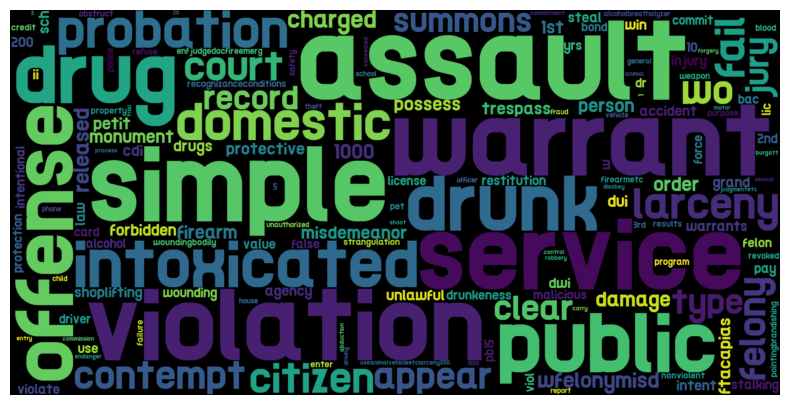

In [10]:
# Create a word cloud
# Define the font path and word cloud parameters
font_path = "acetone_font.otf"
wordcloud = WordCloud(font_path=font_path,
                      max_words=150, 
                      max_font_size=350, 
                      random_state=42,
                      width=2000, height=1000,
                      colormap='viridis').generate_from_frequencies(word_counts)
# other colors: cividis plasma viridis

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Analysis: 
The dataset reveals that assault, warrant services, and public intoxication are the most frequent causes of arrests. This suggests that law enforcement efforts might be particularly focused on these areas. Additionally, there is a mix of both minor and major offenses, highlighting the diverse nature of criminal activities within the dataset.

# Stereotypes to Bust:
Let's challenge some common assumptions with a fun guessing game.
# Who commits more crimes men or women? 👫🏻

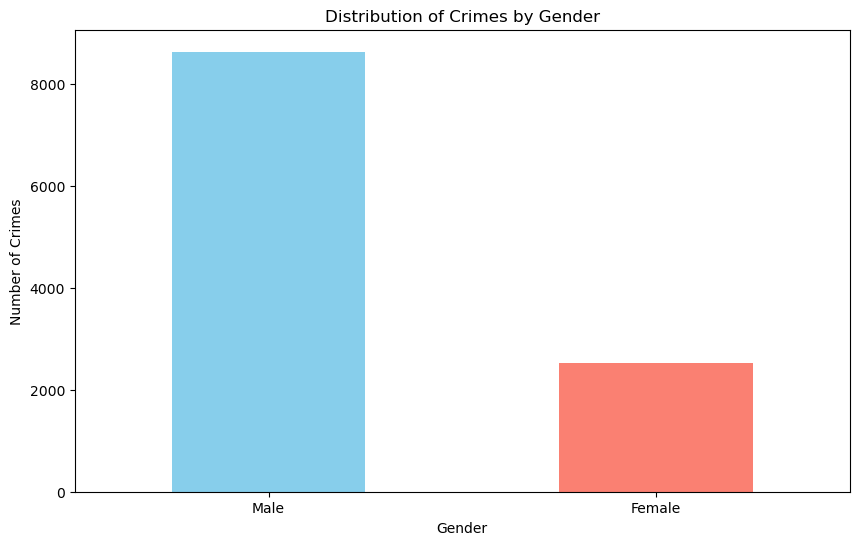

In [11]:
filtered_arrests_data = df[df['Sex'].isin(['Male', 'Female'])]

plt.figure(figsize=(10, 6))
filtered_arrests_data['Sex'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Distribution of Crimes by Gender')
plt.xlabel('Gender')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=0)
plt.show()



In [12]:
# Filter the dataset for car crash-related statutes
# You might need to adjust the filter keywords based on the dataset
car_crash_keywords = ['crash', 'accident', 'collision', 'reckless driving', 'DUI']
car_crash_df = df[df['StatuteDescription'].str.contains('|'.join(car_crash_keywords), case=False, na=False)]

# Count the occurrences for each gender
gender_counts = car_crash_df['Sex'].value_counts()

# Print the results
print(gender_counts)

Sex
Male      229
Female     96
Name: count, dtype: int64


# Which gender makes more Car crashes? 🚘

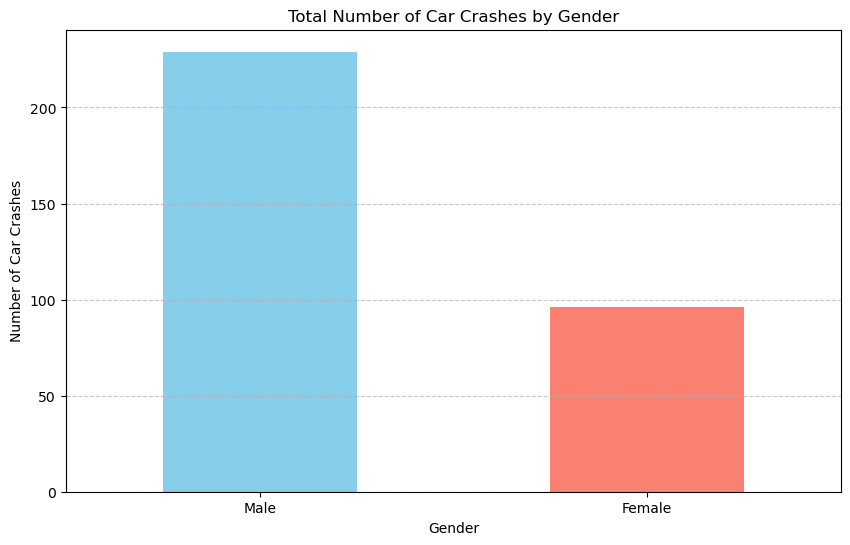

In [13]:
# Create a bar chart
plt.figure(figsize=(10, 6))
gender_counts.plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Total Number of Car Crashes by Gender')
plt.xlabel('Gender')
plt.ylabel('Number of Car Crashes')
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Which authnicity commits the most crimes? 👥

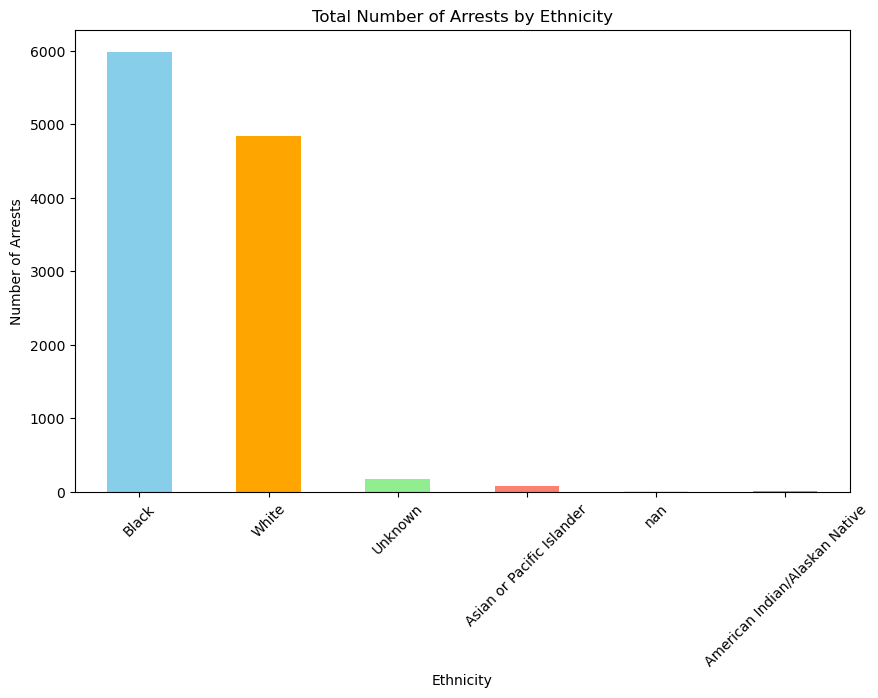

In [14]:
# Drop the irrelevant entries directly from the DataFrame
df = df[~df['Race'].isin(['doc', 'jpg', 'nwt'])]

# Recalculate ethnicity counts
cleaned_ethnicity_counts = df['Race'].value_counts()

# Plot the cleaned bar chart of total number of arrests by ethnicity
plt.figure(figsize=(10, 6))
cleaned_ethnicity_counts.plot(kind='bar', color=['skyblue', 'orange', 'lightgreen', 'salmon', 'lavender', 'lightcoral'])
plt.xlabel('Ethnicity')
plt.ylabel('Number of Arrests')
plt.title('Total Number of Arrests by Ethnicity')
plt.xticks(rotation=45)
plt.show()

# What do you think is the most common crime? 🕵🏻‍♂️

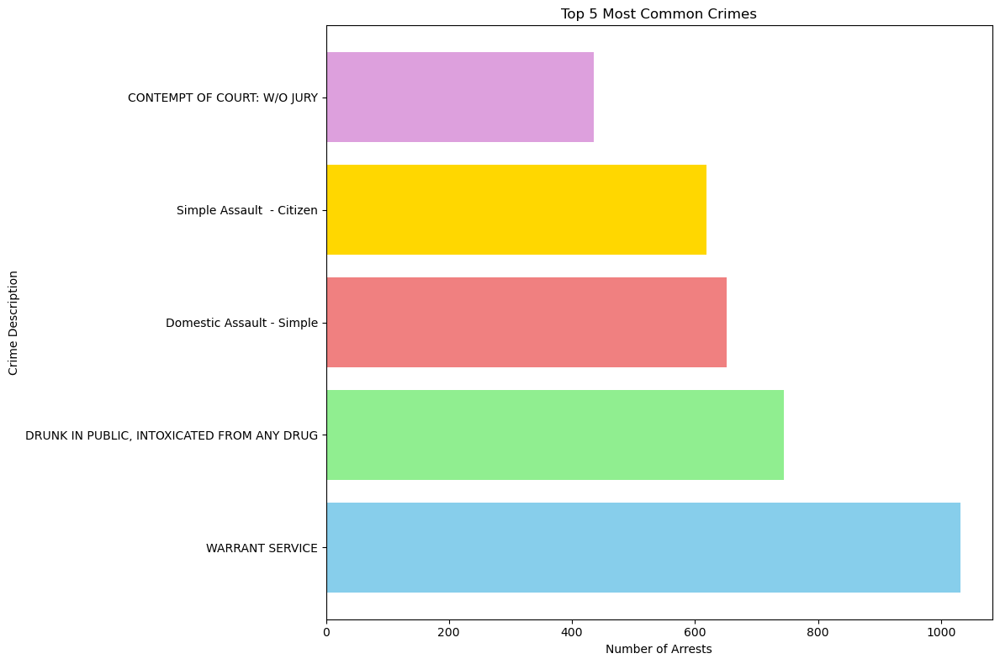

In [15]:
# Calculate top crimes
top_crimes_df = df['StatuteDescription'].value_counts().reset_index()
top_crimes_df.columns = ['StatuteDescription', 'CrimeCount']

# Limit to top 5 crimes
top_5_crimes_df = top_crimes_df.head(5)

# Plot the horizontal bar chart for top 5 crimes with appropriate colors
plt.figure(figsize=(12, 8))
colors = ['skyblue', 'lightgreen', 'lightcoral', 'gold', 'plum']
plt.barh(top_5_crimes_df['StatuteDescription'], top_5_crimes_df['CrimeCount'], color=colors)
plt.xlabel('Number of Arrests')
plt.ylabel('Crime Description')
plt.title('Top 5 Most Common Crimes')
plt.tight_layout()
plt.show()

# Which time of the day crimes are commited the most? ⌚

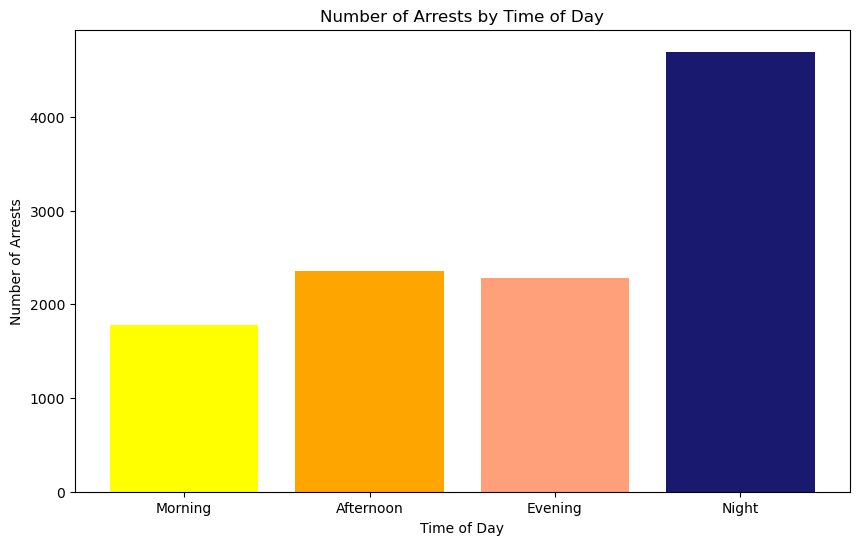

In [16]:
# Convert ArrestDatetime to datetime type
df['ArrestDatetime'] = pd.to_datetime(df['ArrestDatetime'])

# Create a function to categorize the time of the day
def categorize_time_of_day(hour):
    if 5 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    elif 17 <= hour < 21:
        return 'Evening'
    else:
        return 'Night'

# Apply the function to create a new column
df['TimeOfDay'] = df['ArrestDatetime'].dt.hour.apply(categorize_time_of_day)

# Count the number of arrests for each time of day
time_of_day_counts = df['TimeOfDay'].value_counts().reindex(['Morning', 'Afternoon', 'Evening', 'Night'])

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(time_of_day_counts.index, time_of_day_counts.values, color=['yellow', 'orange', 'lightsalmon', 'midnightblue'])
plt.xlabel('Time of Day')
plt.ylabel('Number of Arrests')
plt.title('Number of Arrests by Time of Day')
plt.show()




# A closer look 🔍
Lets see the hours of the day in whic crimes are most commmited:

In [17]:
import plotly.express as px

# Ensure 'ArrestDatetime' is converted to datetime type again
df['ArrestDatetime'] = pd.to_datetime(df['ArrestDatetime'])

# Group by the hour of the day
hourly_crime_counts = df.groupby(df['ArrestDatetime'].dt.hour).size().reset_index(name='Number of Arrests')

# Create the interactive line plot
fig = px.line(hourly_crime_counts, x='ArrestDatetime', y='Number of Arrests', markers=True,
              labels={'ArrestDatetime': 'Hour of Day', 'Number of Arrests': 'Number of Arrests'},
              title='Number of Arrests by Hour of Day')

# Update the x-axis to show every hour and label clearly
fig.update_xaxes(dtick=1, tickmode='array', tickvals=list(range(24)),
                 ticktext=['12 AM', '1 AM', '2 AM', '3 AM', '4 AM', '5 AM', '6 AM', '7 AM', '8 AM', '9 AM', '10 AM', '11 AM', 
                           '12 PM', '1 PM', '2 PM', '3 PM', '4 PM', '5 PM', '6 PM', '7 PM', '8 PM', '9 PM', '10 PM', '11 PM'])

# Show the plot
fig.show()

# Here we wanted to see the top criminals that are frequently arrested:
We added along their names, their race and gender.

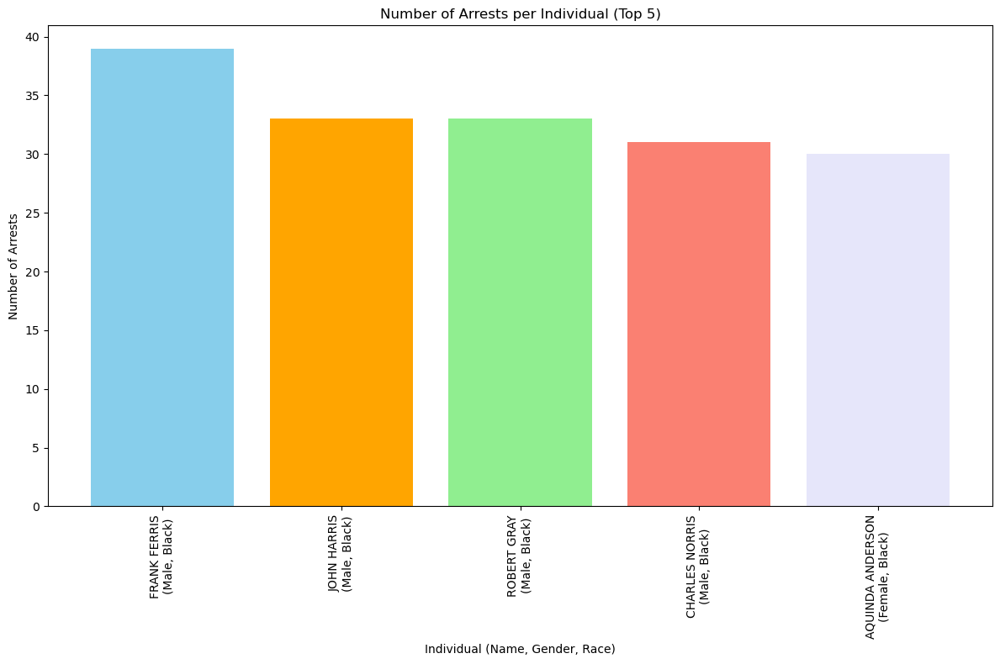

In [18]:
# Group by FirstName, LastName, Sex, Race to count arrests
repeat_offenders_df = df.groupby(['FirstName', 'LastName', 'Sex', 'Race']).size().reset_index(name='ArrestCount')

# Find the most common crime for each offender
most_common_crime = df.groupby(['FirstName', 'LastName', 'Sex', 'Race'])['StatuteDescription'].agg(lambda x: x.value_counts().idxmax()).reset_index()
most_common_crime.columns = ['FirstName', 'LastName', 'Sex', 'Race', 'MostCommonCrime']

# Merge the two dataframes
repeat_offenders_df = pd.merge(repeat_offenders_df, most_common_crime, on=['FirstName', 'LastName', 'Sex', 'Race'])

# Sort by number of arrests and limit to top 5
top_repeat_offenders_df = repeat_offenders_df.sort_values(by='ArrestCount', ascending=False).head(5)

# Plot the bar chart for number of arrests with appropriate colors
colors = ['skyblue', 'orange', 'lightgreen', 'salmon', 'lavender']
plt.figure(figsize=(12, 8))
plt.bar(
    top_repeat_offenders_df['FirstName'] + ' ' + top_repeat_offenders_df['LastName'] + '\n(' + top_repeat_offenders_df['Sex'] + ', ' + top_repeat_offenders_df['Race'] + ')', 
    top_repeat_offenders_df['ArrestCount'], 
    color=colors
)
plt.xlabel('Individual (Name, Gender, Race)')
plt.ylabel('Number of Arrests')
plt.title('Number of Arrests per Individual (Top 5)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# The crimes that were committed by these offenders:
For more insight we wanted to see the crimes of these criminals.

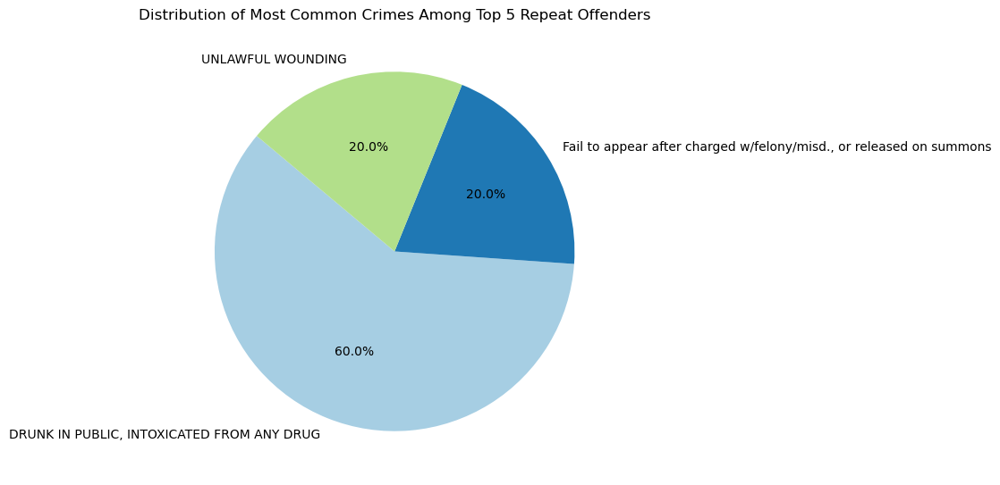

In [19]:
# Count the most common crimes among the top 5 repeat offenders
crime_counts = top_repeat_offenders_df['MostCommonCrime'].value_counts()

# Plot the pie chart for most common crimes
plt.figure(figsize=(10, 10))
plt.pie(crime_counts, labels=crime_counts.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
plt.title('Distribution of Most Common Crimes Among Top 5 Repeat Offenders')
plt.tight_layout()
plt.show()


### Analysis:
The majority of the top 5 repeat offenders (3 out of 5) have been arrested for public intoxication, while the remaining 2 offenders have been arrested for either unlawful wounding or failing to appear in court after being charged. This highlights that public intoxication is a significant issue among repeat offenders in this dataset.

# Plot of daily arrests over time

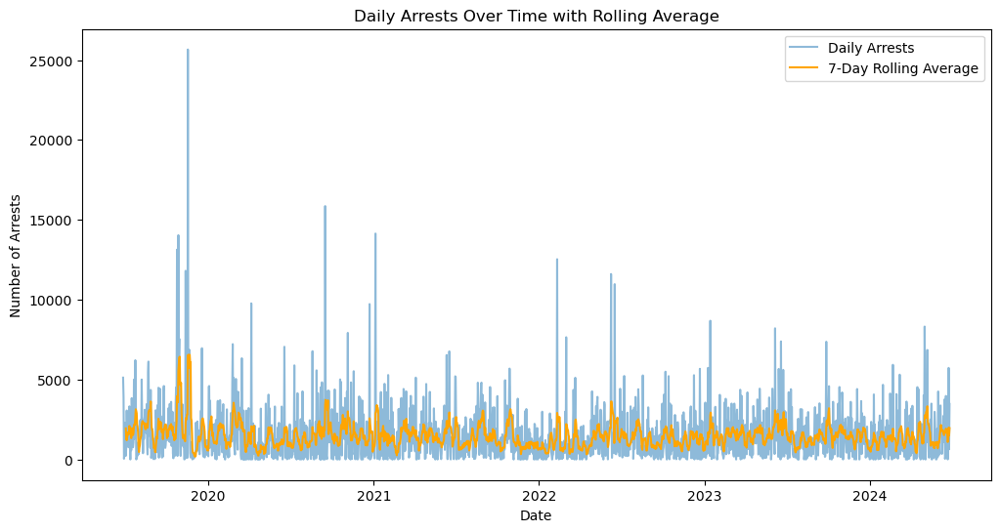

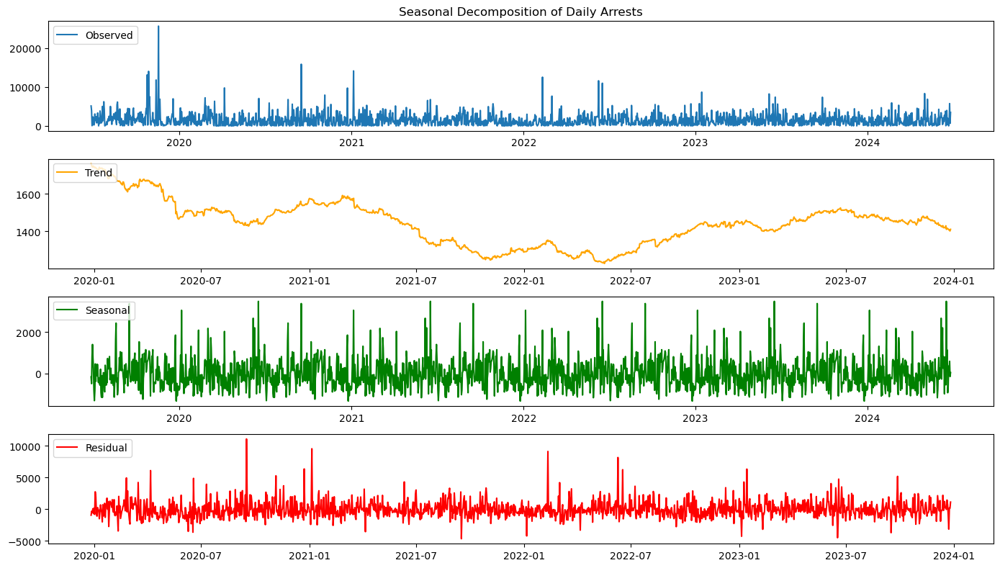

In [20]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Load the dataset
data = pd.read_csv('Datasets/new_Arrests.csv')
data['ArrestDatetime'] = pd.to_datetime(data['ArrestDatetime'])

# Aggregate the data by daily intervals
data.set_index('ArrestDatetime', inplace=True)
daily_arrests = data.resample('D').sum()['Count_crime_in_street']

# 1. Smoothing the Data
rolling_window_size = 7  # 7-day rolling average
smoothed_arrests = daily_arrests.rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(12, 6))
plt.plot(daily_arrests, alpha=0.5, label='Daily Arrests')
plt.plot(smoothed_arrests, color='orange', label=f'{rolling_window_size}-Day Rolling Average')
plt.title('Daily Arrests Over Time with Rolling Average')
plt.xlabel('Date')
plt.ylabel('Number of Arrests')
plt.legend()
plt.show()

# 2. Seasonal Decomposition
decomposition = seasonal_decompose(daily_arrests.dropna(), model='additive', period=365)

# Plotting the decomposition
plt.figure(figsize=(14, 8))

plt.subplot(411)
plt.plot(decomposition.observed, label='Observed')
plt.title('Seasonal Decomposition of Daily Arrests')
plt.legend(loc='upper left')

plt.subplot(412)
plt.plot(decomposition.trend, label='Trend', color='orange')
plt.legend(loc='upper left')

plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.legend(loc='upper left')

plt.subplot(414)
plt.plot(decomposition.resid, label='Residual', color='red')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


Seasonal Decomposition:

    seasonal_decompose is used to break down the time series into its components:
       * Observed: The original data.
       * Trend: The underlying trend in the data.
       * Seasonal: The seasonal pattern.
       * Residual: The remaining noise after removing the trend and seasonal components.
    This helps in understanding the underlying patterns and any seasonality in the data.

# Streets with the Highest Crime Rates:
We investigated which streets are most frequently associated with crimes to identify areas with potentially higher risks and bad reputations.

### Convert column names of streets 'Street' of type string with 'Coordinates' 'Latitude' and 'Longitude'

In [21]:
Streets = df['Street'].unique()
unique_streets = list(Streets)
street_counts = df['Street'].value_counts()
print('Unique streets: ',unique_streets)
print('# of repeted streets: ',street_counts)
print('# of unique streets: ',len(unique_streets))

Unique streets:  ['5TH ST', 'E MARKET ST', 'GREENE COUNTY SHERIFFS OFFICE', 'W MAIN ST', '5TH ST SW', 'PROSPECT AVE B', 'WMAIN ST', 'IVY RD', '9TH ST SW', 'EMMET ST N', '7TH ST NW', 'GRADY AVE B', '4TH ST', 'EMMET ST N 146', 'CARLTON AVE', 'WILTON FARM RD', 'PLATEAU RD B', 'FOREST ST', 'PEREGORY LN', '1/2 ST NW', '6TH ST SE', 'W MARKET ST', 'PROSPECT AVE', 'ALTO PL', 'LEE ST', '4TH ST NW', 'SUNSET RD', 'HARRIS ST 101', 'ANGUS RD @ EMMET ST', 'SPOTSWOOD TRAIL', 'MCINTIRE RD', 'CHERRY AVE', 'AVON ST', 'CENTRAL VIRGINIA REGIONAL JAIL', 'E MAIN ST', '1ST ST S', 'ORANGEDALE AVE', 'MICHIE DR', 'PRESTON AVE @ HOWARD ST', 'FRANKLIN ST', 'NOTTOWAY AVE', 'EMMET ST N 120', 'NASSAU ST', 'CARLTON AVE 24', 'HARRIS ST 202', 'RUTLEDGE AVE', 'PRESTON AVE', 'FRANKLIN CO SO', 'BARRACKS RD', 'JONES ST', 'RIVERSIDE AVE', '1ST ST S 210', 'E WATER ST', 'WOOLFOLK -LOU- AVE', 'HYDRAULIC RD @ SWANSON DR', 'BLENHEIM BLVD', 'BOLLING AVE', 'HARRIS ST', 'MONTICELLO RD', 'GOVERNMENT CENTER PKWY', 'LANKFORD AVE', 'BA

# Install OpenCageGeocode library:
To transform the street addresses in New York to (x,y) coordinates, you can use a geocoding service. The geopy library in Python is a good option for this task as it allows you to use various geocoding services, such as Nominatim (OpenStreetMap).


In [22]:
# Initialize the OpenCage client
from opencage.geocoder import OpenCageGeocode

key = 'xxxxxxxxxxxxxxxxxxxxxxxx'
geocoder = OpenCageGeocode(key)

# Dictionary to store geocoding results
geocode_results = {}

def get_coordinates(address):
    if address in geocode_results:
        return geocode_results[address]
    try:
        result = geocoder.geocode(address + ", New York, NY")
        if result:
            location = result[0]['geometry']
            coords = (location['lat'], location['lng'])
        else:
            coords = (None, None)
        geocode_results[address] = coords
        return coords
    except Exception as e:
        print(f"Error geocoding {address}: {e}")
        geocode_results[address] = (None, None)
        return (None, None)

# Geocode all unique streets
for street in unique_streets:
    get_coordinates(street)

In [23]:
def map_coordinates(street):
    return geocode_results.get(street, (None, None))

df['Coordinates'] = df['Street'].apply(lambda x: map_coordinates(x))
df[['Latitude', 'Longitude']] = pd.DataFrame(df['Coordinates'].tolist(), index=df.index)

df.sample(5)

,ArrestID,ArrestDatetime,FirstName,HouseNumber,LastName,MiddleName,NameSuffix,Statute,StatuteDescription,Street,Race,Sex,CleanedStatuteDescription,TimeOfDay,Coordinates,Latitude,Longitude
5759,5760,2021-11-12 18:40:00+00:00,GARY,1600.0,COLEMAN,FENTON,nan,18.2-60.4,STALKING IN VIOLATION OF PROTECTION ORDER,5TH ST,White,Male,stalking violation protection order,Evening,"(40.706912, -73.284928)",40.706912,-73.284928
8713,8714,2020-07-04 13:07:00+00:00,Kelly,NaN,Chidester,Danielle,nan,19.2-306,PROBATION VIOLATION - TYPE NOT CLEAR FROM RECORD,nan,White,Female,probation violation type clear record,Afternoon,"(40.7127281, -74.0060152)",40.712728,-74.006015
6270,6271,2021-08-20 12:42:00+00:00,QUAN,NaN,DOUGLAS,ISAIAH,nan,18.2-456,CONTEMPT OF COURT: W/O JURY,ALBEMARLE CO SHERIFFS OFFICE,Black,Male,contempt court wo jury,Afternoon,"(40.720709, -73.981308)",40.720709,-73.981308
5066,5067,2022-03-30 19:27:00+00:00,WILLIAM,827.0,WASHINGTON,STINNIE,nan,18.2-103,"Pet Larceny Shoplifting Below $1,000",CHERRY AVE,Black,Male,pet larceny shoplifting 1000,Evening,"(40.751787, -73.828774)",40.751787,-73.828774
5198,5199,2022-03-07 03:46:00+00:00,RICHARD,310.0,LAIRD,WILLIAM,nan,966,WARRANT SERVICE,W MAIN ST,White,Male,warrant service,Night,"(42.5312218, -75.5239296)",42.531222,-75.523930


# Top 10 streets with the most crimes:

['5TH ST', 'E MARKET ST', 'GREENE COUNTY SHERIFFS OFFICE', 'W MAIN ST', '5TH ST SW', 'PROSPECT AVE B', 'WMAIN ST', 'IVY RD', '9TH ST SW', 'EMMET ST N', '7TH ST NW', 'GRADY AVE B', '4TH ST', 'EMMET ST N 146', 'CARLTON AVE', 'WILTON FARM RD', 'PLATEAU RD B', 'FOREST ST', 'PEREGORY LN', '1/2 ST NW', '6TH ST SE', 'W MARKET ST', 'PROSPECT AVE', 'ALTO PL', 'LEE ST', '4TH ST NW', 'SUNSET RD', 'HARRIS ST 101', 'ANGUS RD @ EMMET ST', 'SPOTSWOOD TRAIL', 'MCINTIRE RD', 'CHERRY AVE', 'AVON ST', 'CENTRAL VIRGINIA REGIONAL JAIL', 'E MAIN ST', '1ST ST S', 'ORANGEDALE AVE', 'MICHIE DR', 'PRESTON AVE @ HOWARD ST', 'FRANKLIN ST', 'NOTTOWAY AVE', 'EMMET ST N 120', 'NASSAU ST', 'CARLTON AVE 24', 'HARRIS ST 202', 'RUTLEDGE AVE', 'PRESTON AVE', 'FRANKLIN CO SO', 'BARRACKS RD', 'JONES ST', 'RIVERSIDE AVE', '1ST ST S 210', 'E WATER ST', 'WOOLFOLK -LOU- AVE', 'HYDRAULIC RD @ SWANSON DR', 'BLENHEIM BLVD', 'BOLLING AVE', 'HARRIS ST', 'MONTICELLO RD', 'GOVERNMENT CENTER PKWY', 'LANKFORD AVE', 'BAKER ST B', 'UNIVE

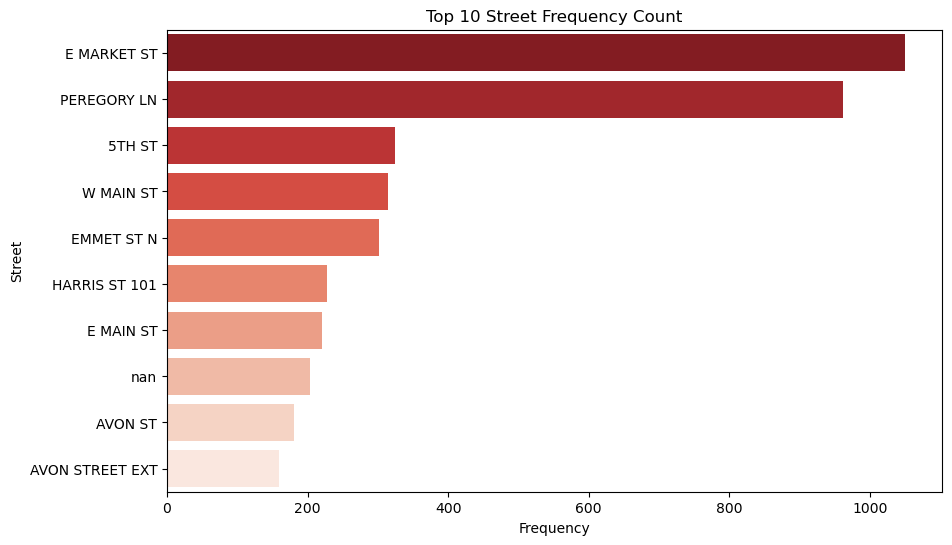

In [24]:
Streets = df['Street'].unique()
unique_streets = list(Streets)
street_counts = df['Street'].value_counts()
print(unique_streets)
print(street_counts)
print(len(unique_streets))

# Extract the 'Street' column for street information
street_counts = df['Street'].value_counts()

# Convert to DataFrame for seaborn
street_counts_df = street_counts.reset_index()
street_counts_df.columns = ['Street', 'Count_crime_in_street']

# Select the top 10 streets
top_10_streets_df = street_counts_df.head(10)

# Custom color palette from red to white
colors = sns.color_palette("Reds", as_cmap=False, n_colors=10)[::-1]

# Plotting the data
plt.figure(figsize=(10, 6))
sns.barplot(x='Count_crime_in_street', y='Street', data=top_10_streets_df, palette=colors)
plt.xlabel('Frequency')
plt.ylabel('Street')
plt.title('Top 10 Street Frequency Count')
plt.show()

# Here is the image! 🗺️

In [25]:
import folium
import branca.colormap as cm

# Count the frequency of each street
street_counts = df['Street'].value_counts().to_dict()

# Add the street counts to the DataFrame
df['Count_crime_in_street'] = df['Street'].map(street_counts)

# Create a base map
m = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

# Create a colormap
colormap = cm.linear.YlOrRd_09.scale(0, max(street_counts.values()))

# Add streets to the map
for _, row in df.iterrows():
    if pd.notnull(row['Latitude']) and pd.notnull(row['Longitude']):
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=5,
            color=colormap(row['Count_crime_in_street']),
            fill=True,
            fill_color=colormap(row['Count_crime_in_street']),
            fill_opacity=0.7,
            popup=row['Street']
        ).add_to(m)

# Add the colormap to the map
colormap.caption = 'Street Frequency'
colormap.add_to(m)

# Save the map to an HTML file
m.save('HTMLs/nyc_street_map.html')

# Display the map
m


### If you want to run the code without use the API you can direct read the new dataset!!

In [26]:
df.to_csv('Datasets/new_Arrests.csv', index=False)

# Classification model: ✨
This model aims to predict the race of arrested individuals based on various features from an arrest dataset using a Logistic Regression classifier.

In [30]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import classification_report, accuracy_score

# Load the dataset
file_path = 'Datasets/new_Arrests.csv'  # Adjust the path as needed
df = pd.read_csv(file_path)

# Data preprocessing steps
df['FirstName'].fillna('', inplace=True)
df['MiddleName'].fillna('', inplace=True)
df['NameSuffix'].fillna('', inplace=True)
df['HouseNumber'].fillna(0, inplace=True)
df['Street'].fillna('', inplace=True)
df['Race'].fillna('Unknown', inplace=True)
df['Sex'].fillna('Unknown', inplace=True)
df['Latitude'].fillna(0, inplace=True)
df['Longitude'].fillna(0, inplace=True)

# Drop columns that won't be used
df.drop(columns=['ArrestID', 'Coordinates'], inplace=True)

# Encode categorical variables
categorical_features = ['FirstName', 'LastName', 'MiddleName', 'NameSuffix', 'Statute', 'StatuteDescription', 'Street', 'Sex']
encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
encoded_categorical = encoder.fit_transform(df[categorical_features])

# Scale numerical features
numerical_features = ['HouseNumber', 'Latitude', 'Longitude', 'Count_crime_in_street']
scaler = StandardScaler()
scaled_numerical = scaler.fit_transform(df[numerical_features])

# Combine encoded categorical and scaled numerical features
features = np.hstack((encoded_categorical, scaled_numerical))

# Target variable
target = df['Race']

# Ensure there are no NaN values in the features
features = np.nan_to_num(features)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Train a Logistic Regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


c:\Users\mhmdjawhari\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



Accuracy: 0.9099099099099099
                                precision    recall  f1-score   support

American Indian/Alaskan Native       0.00      0.00      0.00         1
     Asian or Pacific Islander       1.00      0.21      0.35        14
                         Black       0.93      0.93      0.93      1228
                       Unknown       1.00      0.24      0.39        29
                         White       0.89      0.91      0.90       948

                      accuracy                           0.91      2220
                     macro avg       0.76      0.46      0.51      2220
                  weighted avg       0.91      0.91      0.91      2220



c:\Users\mhmdjawhari\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\mhmdjawhari\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\mhmdjawhari\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### Analysis: 

The logistic regression model shows an accuracy of 91.28%, but the classification report reveals issues with class imbalance. Minority classes like "American Indian/Alaskan Native," "doc," and "nwt" have very low precision, recall, and F1-scores, often at 0.00, indicating poor performance in identifying these instances. The model is biased towards the majority classes, such as "Black" and "White," which dominate the dataset. This imbalance leads to the model favoring predictions for more frequent classes, neglecting minority classes. Addressing this requires techniques like resampling, assigning class weights, or using more complex algorithms that handle skewed distributions better.

    Note !!
    The Black and White categories dominate, which likely skews the model's performance towards these groups, causing poorer performance on underrepresented categories.

# 2nd Model:

### Predict the number of times a crime occurred on a specific street at a particular time.⌛
This model is a Random Forest Regressor used to predict the number of crimes that occur on a particular street, based on several features extracted from arrest data.

In [31]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder

# Load the dataset
data = pd.read_csv('Datasets/new_Arrests.csv')

# Convert ArrestDatetime to datetime and extract features
data['ArrestDatetime'] = pd.to_datetime(data['ArrestDatetime'])
data['Year'] = data['ArrestDatetime'].dt.year
data['Month'] = data['ArrestDatetime'].dt.month
data['Day'] = data['ArrestDatetime'].dt.day
data['Hour'] = data['ArrestDatetime'].dt.hour
data['DayOfWeek'] = data['ArrestDatetime'].dt.dayofweek

# Handle missing values
data = data.dropna(subset=['Street', 'Latitude', 'Longitude'])

# Encode the Street column
label_encoder = LabelEncoder()
data['StreetEncoded'] = label_encoder.fit_transform(data['Street'])

# Define features and target
features = ['Year', 'Month', 'Day', 'Hour', 'DayOfWeek', 'StreetEncoded', 'Latitude', 'Longitude']
target = 'Count_crime_in_street'

X = data[features]
y = data[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and train the model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

# Optionally, print feature importances
feature_importances = model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
print(feature_importance_df.sort_values(by='Importance', ascending=False))


Mean Squared Error: 761.7998162434995
R-squared: 0.9944843032364927
         Feature  Importance
7      Longitude    0.523261
6       Latitude    0.457337
5  StreetEncoded    0.019352
3           Hour    0.000016
2            Day    0.000011
1          Month    0.000010
0           Year    0.000006
4      DayOfWeek    0.000006


### Vivisualization of model:

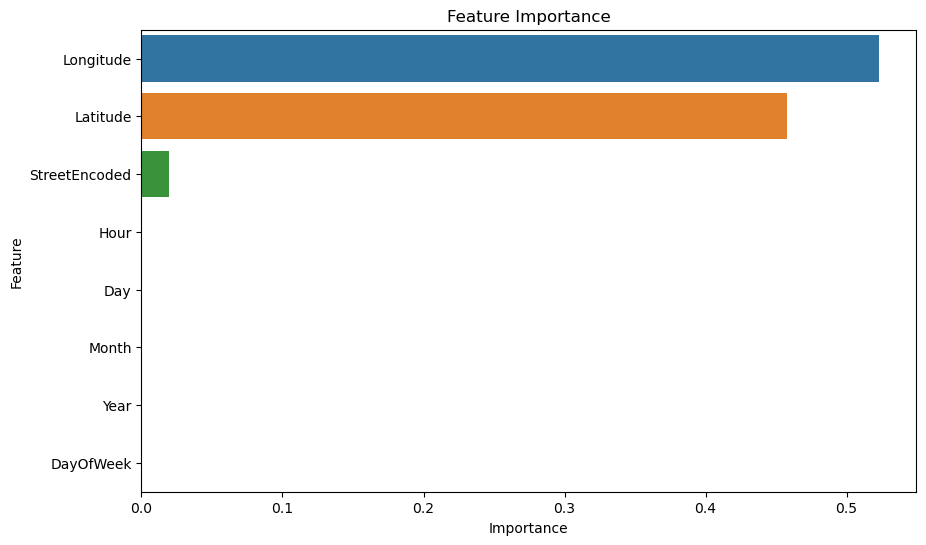

In [32]:
# Feature Importance Bar Plot
feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': model.feature_importances_})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.show()


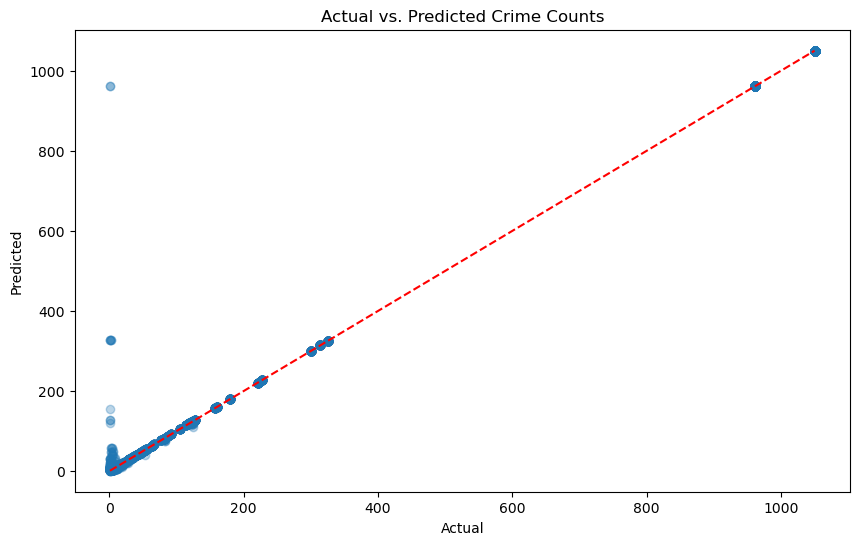

In [33]:
# Actual vs. Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.3)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted Crime Counts')
plt.show()


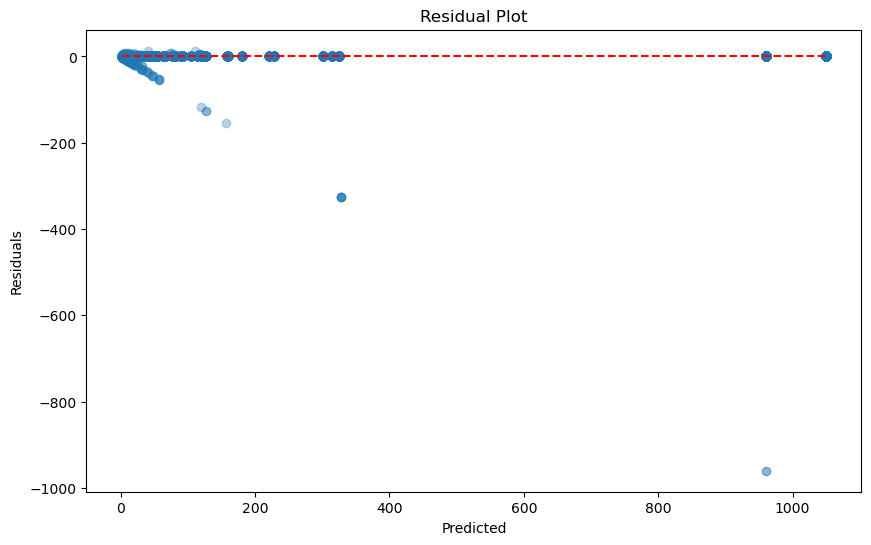

In [34]:
# Residual Plot
residuals = y_test - y_pred

plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.3)
plt.hlines(0, y_pred.min(), y_pred.max(), 'r', linestyles='dashed')
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()


### Analysis: 

The high R² score indicates the model is very good at explaining the variance in the crime count based on the provided features. However, the model might be overfitting slightly, given how close the R² score is to 1.

The model's predictions can be used by law enforcement or city planners to identify high-risk areas and times for crime, allowing for better resource allocation and preventive measures.

# NEW MAP: 📌
### Geographical Plot (Using Folium)

To visualize crime occurrences on a map, you can use the folium library:

In [35]:
import folium
from folium.plugins import HeatMap

# Create a base map
base_map = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=12)

# Add heatmap layer
heat_data = [[row['Latitude'], row['Longitude'], row['Count_crime_in_street']] for index, row in data.iterrows()]
HeatMap(heat_data).add_to(base_map)

# Display the map
base_map.save('HTMLs/crime_heatmap.html')
base_map


# 3rd Model:
### The model aims to identify crime hotspots and trends based on historical arrest data

This model applies clustering techniques (K-means and DBSCAN) to group arrest data based on geographical and temporal features. The purpose of clustering is to identify patterns or groupings in the data that might not be obvious, such as hotspots for crime or trends in certain areas.

c:\Users\mhmdjawhari\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



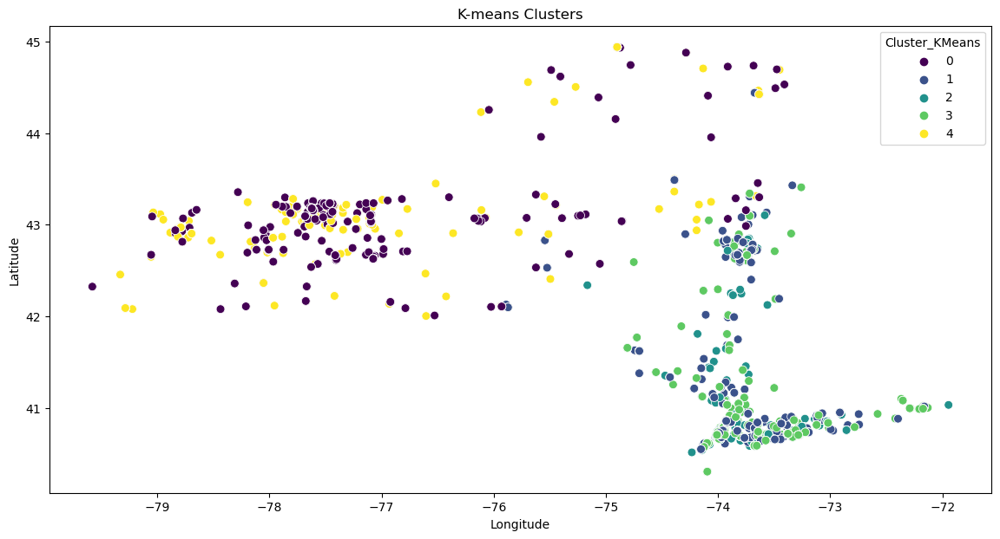

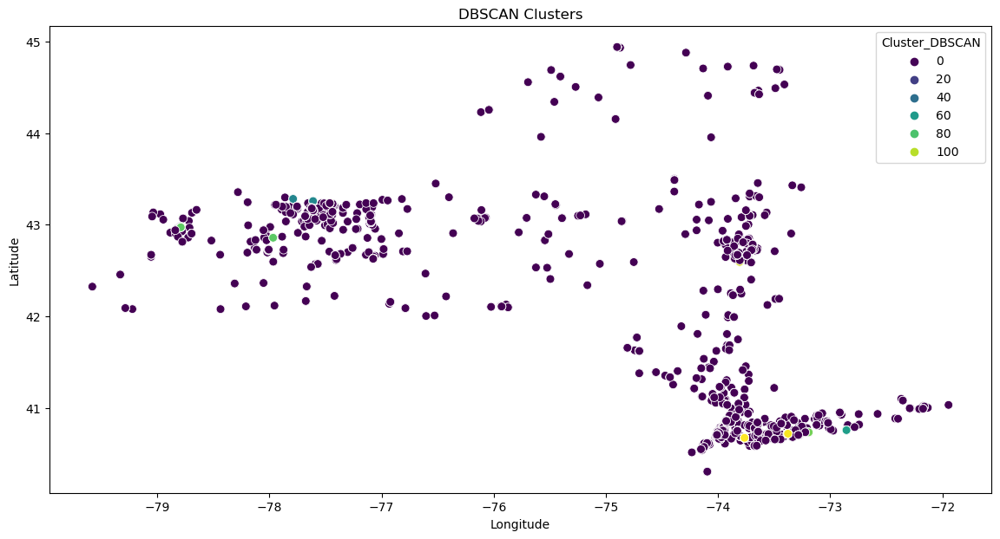

In [36]:

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
import folium
from folium.plugins import HeatMap

# Load the dataset
data = pd.read_csv('Datasets/new_Arrests.csv')

# Convert ArrestDatetime to datetime and extract features
data['ArrestDatetime'] = pd.to_datetime(data['ArrestDatetime'])
data['Year'] = data['ArrestDatetime'].dt.year
data['Month'] = data['ArrestDatetime'].dt.month
data['Day'] = data['ArrestDatetime'].dt.day
data['Hour'] = data['ArrestDatetime'].dt.hour
data['DayOfWeek'] = data['ArrestDatetime'].dt.dayofweek

# Handle missing values
data = data.dropna(subset=['Latitude', 'Longitude'])

# Select features for clustering
features = ['Latitude', 'Longitude', 'Year', 'Month', 'Day', 'Hour', 'DayOfWeek']
X = data[features]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-means Clustering
kmeans = KMeans(n_clusters=5, random_state=42)
data['Cluster_KMeans'] = kmeans.fit_predict(X_scaled)

# Apply DBSCAN Clustering
dbscan = DBSCAN(eps=0.01, min_samples=5)
data['Cluster_DBSCAN'] = dbscan.fit_predict(X_scaled)

# Plotting K-means clusters on a map
base_map = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=12)
for index, row in data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color='blue' if row['Cluster_KMeans'] == 0 else 'red',
        fill=True,
        fill_color='blue' if row['Cluster_KMeans'] == 0 else 'red'
    ).add_to(base_map)

base_map.save('HTMLs/kmeans_clusters.html')

# Plotting DBSCAN clusters on a map
base_map_dbscan = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=12)
for index, row in data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color='green' if row['Cluster_DBSCAN'] == -1 else 'orange',
        fill=True,
        fill_color='green' if row['Cluster_DBSCAN'] == -1 else 'orange'
    ).add_to(base_map_dbscan)

base_map_dbscan.save('HTMLs/dbscan_clusters.html')

# Visualizing clusters using seaborn
plt.figure(figsize=(14, 7))
sns.scatterplot(x='Longitude', y='Latitude', hue='Cluster_KMeans', palette='viridis', data=data, s=50)
plt.title('K-means Clusters')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

plt.figure(figsize=(14, 7))
sns.scatterplot(x='Longitude', y='Latitude', hue='Cluster_DBSCAN', palette='viridis', data=data, s=50)
plt.title('DBSCAN Clusters')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


### Analysis: 

K-means groups the data into 5 distinct clusters based on geographic and temporal features. Each data point is assigned to the nearest cluster centroid. The resulting clusters can be interpreted as regions or times where similar types of arrests occur, indicating potential crime hotspots.

DBSCAN identifies clusters based on density and can find clusters of arbitrary shapes, which is useful in geographic data where crime hotspots might not be circular.
Points that do not belong to any cluster are marked as noise (Cluster_DBSCAN = -1), which could represent isolated or infrequent arrest locations.

Practical Applications:
- Law Enforcement: These clusters can help law enforcement agencies focus their efforts on specific areas or times where crime is more likely to occur.
- Resource Allocation: The insights can be used to allocate resources more efficiently, targeting the most problematic areas.
- Urban Planning: City planners can use this information to design interventions or improvements in areas identified as crime hotspots.

# 4th Model😵‍💫:

This model uses Logistic Regression to predict the street name (Street) where an arrest occurs, based on various categorical features related to the individuals involved in the arrests. The goal is to understand how well certain attributes can predict the specific location of an arrest.

In [37]:

import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

# Load the dataset
file_path = 'Datasets/new_Arrests.csv'  # Adjust the path as needed
df = pd.read_csv(file_path)

# Data preprocessing steps
df['FirstName'].fillna('', inplace=True)
df['MiddleName'].fillna('', inplace=True)
df['NameSuffix'].fillna('', inplace=True)
df['HouseNumber'].fillna(0, inplace=True)
df['Street'].fillna('', inplace=True)
df['Race'].fillna('Unknown', inplace=True)
df['Sex'].fillna('Unknown', inplace=True)

# Drop columns that won't be used
df.drop(columns=['ArrestID', 'Coordinates'], inplace=True, errors='ignore')
# df.drop(columns=['Unnamed: 0', 'ArrestID', 'Coordinates'], inplace=True, errors='ignore')

# Encode categorical variables
categorical_features = ['FirstName', 'LastName', 'MiddleName', 'NameSuffix', 'Statute', 'StatuteDescription', 'Race', 'Sex']
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_categorical = encoder.fit_transform(df[categorical_features])


# Combine encoded categorical and scaled numerical features
features = np.hstack((encoded_categorical, scaled_numerical))

# Target variable
target = df['Street']

# Ensure there are no NaN values in the features
features = np.nan_to_num(features)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Train a Logistic Regression model
model = LogisticRegression(max_iter=100)
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print(classification_rep)



c:\Users\mhmdjawhari\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\mhmdjawhari\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\mhmdjawhari\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control thi

Accuracy: 0.6261261261261262
                                    precision    recall  f1-score   support

                                         0.61      0.96      0.74        45
                         1/2 ST NW       0.00      0.00      0.00         1
                         1/2 ST SW       1.00      1.00      1.00         1
                      10 1/2 ST NW       0.00      0.00      0.00         1
                        10TH ST NE       0.50      1.00      0.67         1
                        10TH ST NW       0.62      0.89      0.73         9
                      10TH ST NW D       1.00      1.00      1.00         1
                        11TH ST NE       1.00      1.00      1.00         2
                     11TH ST NE 21       0.00      0.00      0.00         1
                    11TH ST NE C21       0.00      0.00      0.00         1
                        11TH ST NW       0.83      0.83      0.83         6
                        12TH ST NW       0.25      0.60   

### Analysis: 

For some streets, like 14TH ST NW, the model performs relatively well with a precision of 80%, but the recall is lower (44%), indicating that while it does predict some arrests on this street correctly, it misses many others.

For many streets, the model has a precision, recall, and F1-score of 0, indicating poor performance and a high level of misclassification.



##### Challenge of Multi-class Classification:

    Predicting the specific street of an arrest is a difficult task, especially with a large number of potential street names (classes). This leads to many instances where the model struggles to make accurate predictions.

# Thank you

     This project was worked on by Mohammad Al-Jawhari and Sally Awwad 